In [2]:
import IPython
from IPython.display import Audio
from scipy.io import wavfile
import scipy.signal
import numpy as np
import matplotlib.pyplot as plt
import librosa
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage import data, img_as_float
from datetime import timedelta
import pandas as pd
import cv2
import IPython.display as Disp
from IPython.display import clear_output
from ipywidgets import widgets
import librosa.display
import sys
import xenocanto
from pydub import AudioSegment
import os
import skimage.io
from scipy.signal import find_peaks
from os.path import exists

%matplotlib inline

In [3]:
def scale_minmax(X, min=0.0, max=1.0):
    """
        Scale an image

        Parameters
        ----------
        X: 2d image mesh to be scaled
        min, max: all points will be scaled within these values
    """

    X_std = (X - X.min()) / (X.max() - X.min())
    X_scaled = X_std * (max - min) + min
    return X_scaled

In [26]:
def spectrogram_image(start_sample,birddir,birdstr,y,sr):

    """
        Record an image from the recording stored in y, starting from the start_sample pixel.
        Images will be 512x256 pixels; these can be downscaled as needed later.

        Parameters
        ----------
        start_sample: pixel value to start at
        birddir, birdstr: the directory where images will be stored, and their prefix
        y,sr: data of audio recording
    """

    hop_length = 512 # number of samples per time-step in spectrogram
    n_mels = 256 # number of bins in spectrogram. Height of image
    time_steps = 512# number of time-steps. Width of image
    length_samples = time_steps*hop_length

    #Delete start/end pops, then pad the ends with reflections
    y=y[10000:]
    y=y[:-10000]
    prepend=np.flip(y[0:3*sr])
    append=np.flip(y[-3*sr:])
    y=np.concatenate((prepend,y))
    y=np.concatenate((y,append))

    window = y[3*sr+start_sample-(128)*hop_length:3*sr+start_sample+length_samples-(129)*hop_length]

    mels = librosa.feature.melspectrogram(y=window, sr=sr, n_mels=n_mels,
                                                n_fft=hop_length*4, hop_length=hop_length, fmax=14000, fmin=1000, power=1)
    pcen = librosa.pcen(mels * (2**31), time_constant=1.0,bias=10, gain=0.8, eps=1e-06,power=0.25,hop_length=hop_length)

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = './dataset/jpgs/'+birddir+'/'+birdstr+'.png'
    skimage.io.imsave(out, img)

In [5]:
def get_ROI(filename):
    """
        Show the spectrum of an audio file. User will select the call of interest and then press enter.
        Function returns the template to be searched

        Parameters
        ----------
        filename: mp3 file to be templated
    """
    n_mels=256
    hop_length=512
    
    sound = AudioSegment.from_mp3(filename)
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=48000)

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                            n_fft=hop_length*4, hop_length=hop_length, fmax=11025, fmin=1000, power=1)
    logmel = librosa.amplitude_to_db(mels, ref=np.max)
    pcen = librosa.pcen(mels * (2**31), time_constant=1.0,bias=10, gain=0.8, eps=1e-06,power=0.25,hop_length=hop_length)

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)

    # min-max scale to fit inside 8-bit range
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    
    im = cv2.imread("spec.png");
    %matplotlib qt
    #Select box
    #push enter
    #push esc
    r = cv2.selectROI('select', im)
    cv2.destroyWindow('select')
    
    %matplotlib inline

    im = cv2.imread("spec.png");
    imCrop = im[10:256-10, int(r[0]):int(r[0]+230)]
    fig, ax = plt.subplots(figsize=(5,5))
    ax.imshow(imCrop)
    ax.set_title('Selected template')
    print("If all went well, the template of interest should be shown, well-centered.")
    return imCrop, sr

In [6]:
def display_matches(imCrop):
    """
        Display the matches of a run of 'get_ROI' within that recording. 
        The idea here is to check for centering.
    """
    im = cv2.imread("spec.png");
    hop_length=512
    xc,sr= librosa.load('sandbox.wav',sr=48000)
    #Define a correlation between the template and the image
    result = cv2.matchTemplate(imCrop,im,5)
    #Find peak local maximum above a threshold correlation
    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.2)

    #detection times
    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times')
    df=df.reset_index(drop=True)

    peaks = find_peaks(np.array(df['corr']),height=0.23,distance=4)
    df=df.iloc[peaks[0]].reset_index(drop=True)
    
    fig, axes = plt.subplots(len(df.x),1,figsize=(5,5*len(df.x)))
    for i in range(len(df)):
        axes[i].imshow(im[:,df.y[i]:df.y[i]+256])
    print("You should see all instances of a template within your recording, well-centered.")


In [7]:
def list_candidates(newtemplate,im,thresh):
    """
        Show the possible matches of a template above a threshold
    """
    result = cv2.matchTemplate(newtemplate,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    peaks = find_peaks(np.array(df['corr']),height=thresh,distance=4)
    df=df.iloc[peaks[0]].reset_index(drop=True)
    
    fig, axes = plt.subplots(len(df.x),1,figsize=(20,10))
    for i in range(len(df)):
        if (len(df)>1): axes[i].imshow(im[:,df.y[i]:df.y[i]+256])
        else:axes.imshow(im[:,df.y[i]:df.y[i]+256])
    plt.show()
    
    return df

In [8]:
#Lines to make plots interactive
from PyQt5.QtWidgets import QApplication, QDialog
from PyQt5.QtCore import QCoreApplication

#app = QApplication(sys.argv)
app = QCoreApplication.instance()
if app is None:
    app = QApplication(sys.argv)

In [9]:
#Uncomment these lines on your first run thru--they will download N recordings for any bird you name
#mp3_list = xenocanto.download(['Eastern Meadowlark'],500)
#mp3_list = xenocanto.download(['Northern Bobwhite'],500)
#mp3_list = xenocanto.download(['Painted Bunting'],500)
#mp3_list = xenocanto.download(['Dickcissel'],500)
#mp3_list = xenocanto.download(['Bell\'s Vireo'],500)

In [9]:
#These are the directories the above data is downloaded to
emdir='./dataset/audio/EasternMeadowlark/'
bvdir='./dataset/audio/Bell\'sVireo/'
dcdir='./dataset/audio/Dickcissel/'
nbdir='./dataset/audio/NorthernBobwhite/'
pbdir='./dataset/audio/PaintedBunting/'

In [10]:
import glob
nbfiles=glob.glob(nbdir+'*.mp3')
emfiles=glob.glob(emdir+'*.mp3')
bvfiles=glob.glob(bvdir+'*.mp3')
dcfiles=glob.glob(dcdir+'*.mp3')
nbfiles=glob.glob(nbdir+'*.mp3')
pbfiles=glob.glob(pbdir+'*.mp3')

In [11]:
emnames=[]
for i in range(len(emfiles)):
    filename, file_extension = os.path.splitext(os.path.basename(emfiles[i]))
    emnames=np.append(emnames,'em'+filename)
nbnames=[]
for i in range(len(nbfiles)):
    filename, file_extension = os.path.splitext(os.path.basename(nbfiles[i]))
    nbnames=np.append(nbnames,'nb'+filename)
bvnames=[]
for i in range(len(bvfiles)):
    filename, file_extension = os.path.splitext(os.path.basename(bvfiles[i]))
    bvnames=np.append(bvnames,'bv'+filename)
dcnames=[]
for i in range(len(dcfiles)):
    filename, file_extension = os.path.splitext(os.path.basename(dcfiles[i]))
    dcnames=np.append(dcnames,'dc'+filename)
pbnames=[]
for i in range(len(pbfiles)):
    filename, file_extension = os.path.splitext(os.path.basename(pbfiles[i]))
    pbnames=np.append(pbnames,'pb'+filename)

Eastern meadowlark

Step 1: Select a region of interest from one recording. Find all occurances of that ROI, average them, and return.

/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


If all went well, the template of interest should be shown, well-centered.


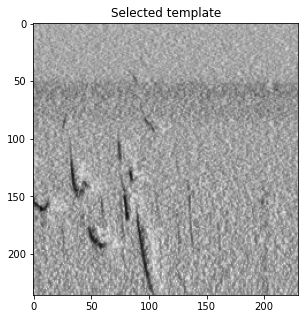

In [16]:
imCrop, sr=get_ROI(emfiles[2])
n_mels=256
hop_length=512

You should see all instances of a template within your recording, well-centered.


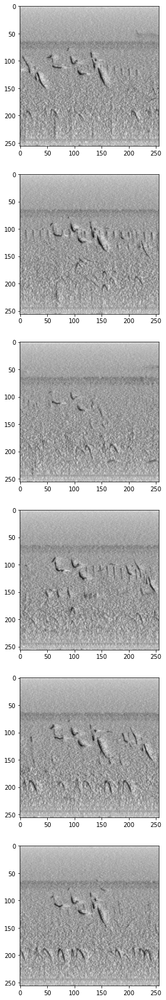

In [49]:
display_matches(imCrop)

Step 2: Open a new recording. Search it for the call which is *most* like the template

In [87]:
for j in range(len(emfiles)):
    sound = AudioSegment.from_mp3(emfiles[j])
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=None)
    #Pad field data with 1 second of reflected data (helps when searching for template)
    xc=np.concatenate((xc[sr:],xc))
    xc=np.append(xc,xc[:sr])

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                        n_fft=hop_length*4, hop_length=hop_length, power=1)

    pcen = librosa.pcen(mels * (2**31), time_constant=1.5,bias=10, gain=0.8, eps=1e-06,power=0.5,hop_length=hop_length)
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    im = cv2.imread("spec.png");

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)
    plt.pause(0.1)

    im = cv2.imread("spec.png");
    result = cv2.matchTemplate(imCrop,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    if (len(df)>0):
        fig, axes = plt.subplots(5,5,figsize=(15,15))
        axes = axes.ravel()
        for i in range(np.min((len(df),25))):
            topick=newtemplate=im[10:237,df.y[i]:df.y[i]+256]
            axes[i].imshow(topick)
            axes[i].text(50, 50, str(i),
                     fontsize=18, ha='center')
        plt.pause(0.1)        
        bestidx = int(input('Enter the template number you wish to search for:'))
        newtemplate=im[10:246,df.y[bestidx]:df.y[bestidx]+220]   
        #newtemplate=im[10:256-10,df.y[0]:df.y[0]+220]

        df=list_candidates(newtemplate,im,0.26)

        add = input('Add these to the library?')

        if (add.replace('.','').isdigit()):
            clear_output(wait=False)
            df=list_candidates(newtemplate,im,float(add))
            add = input('Add these to the library?')
        if (add.replace('.','').isdigit()):
            clear_output(wait=False)
            df=list_candidates(newtemplate,im,float(add))
            add = input('Add these to the library?')
        if (add.replace('.','').isdigit()):
            clear_output(wait=False)
            df=list_candidates(newtemplate,im,float(add))
            add = input('Add these to the library?')

        if (add=='y'): 
            fn='./dataset/audioclips/EasternMeadowlark/em_'+str(j)
            df.to_csv(fn)
            for i in range(len(df)):
                birdstr='em_'+str(j)+'_'+str(i)
                # def spectrogram_image(start_sample,birddir,birdstr,y,sr):
                spectrogram_image(df.y[i]*512,'EasternMeadowlark',birdstr,xc,sr)
                clear_output(wait=False)
        else:
            clear_output(wait=False)
    else: clear_output(wait=False)

Repeat the above steps for any 

/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


If all went well, the template of interest should be shown, well-centered.


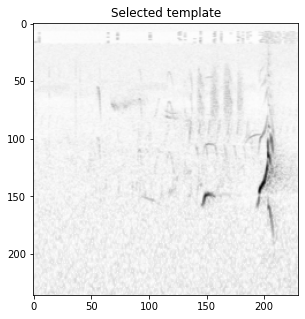

In [17]:
imCrop=get_ROI(nbfiles[3])

You should see all instances of a template within your recording, well-centered.


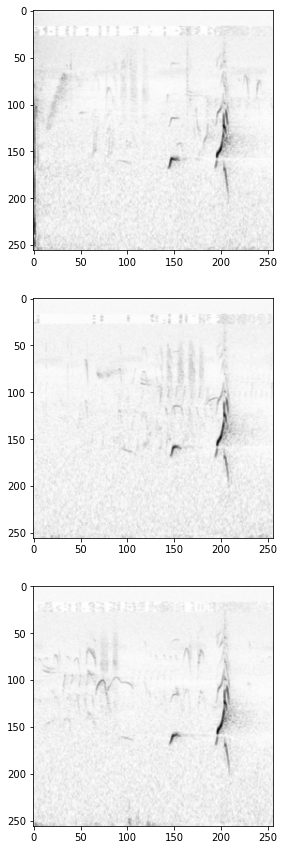

In [18]:
display_matches(imCrop)

In [19]:
nbout='./dataset/jpgs/NorthernBobwhite/'
n_mels=256
hop_length=512

In [20]:
for j in range(31,32):
    sound = AudioSegment.from_mp3(nbfiles[j])
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=41000)
    #Pad field data with 1 second of reflected data (helps when searching for template)
    xc=np.concatenate((xc[sr:],xc))
    xc=np.append(xc,xc[:sr])

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                        n_fft=hop_length*4, hop_length=hop_length, power=1)

    pcen = librosa.pcen(mels * (2**31), time_constant=1.5,bias=10, gain=0.8, eps=1e-06,power=0.5,hop_length=hop_length)
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    im = cv2.imread("spec.png");

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)
    plt.pause(0.1)

    im = cv2.imread("spec.png");
    result = cv2.matchTemplate(imCrop,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    fig, axes = plt.subplots(5,5,figsize=(15,15))
    axes = axes.ravel()
    for i in range(np.min((len(df),25))):
        topick=newtemplate=im[10:237,df.y[i]:df.y[i]+256]
        axes[i].imshow(topick)
        axes[i].text(50, 50, str(i),
                 fontsize=18, ha='center')
    plt.pause(0.1)        
    bestidx = int(input('Enter the template number you wish to search for:'))
    newtemplate=im[10:246,df.y[bestidx]:df.y[bestidx]+220]   
    #newtemplate=im[10:256-10,df.y[0]:df.y[0]+220]
    
    df=list_candidates(newtemplate,im,0.26)
        
    add = input('Add these to the library?')
    
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    
    if (add=='y'): 
        fn='./dataset/audioclips/NorthernBobwhite/nb_'+str(j)
        df.to_csv(fn)
        for i in range(len(df)):
            birdstr='nb_'+str(j)+'_'+str(i)
            # def spectrogram_image(start_sample,birddir,birdstr,y,sr):
            spectrogram_image(df.y[i]*512,'NorthernBobwhite',birdstr,xc,sr)
            clear_output(wait=False)
    else:
        clear_output(wait=False)

Painted Bunting

/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


If all went well, the template of interest should be shown, well-centered.


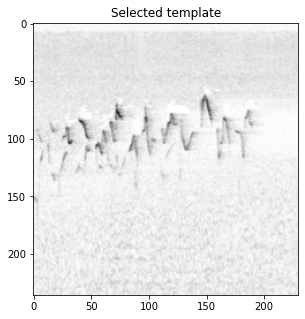

In [45]:
imCrop, sr=get_ROI(pbfiles[4])

You should see all instances of a template within your recording, well-centered.


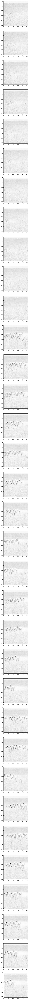

In [46]:
display_matches(imCrop)

In [69]:
for j in range(99,len(pbfiles)):
    sound = AudioSegment.from_mp3(pbfiles[j])
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=41000)
    #Pad field data with 1 second of reflected data (helps when searching for template)
    xc=np.concatenate((xc[sr:],xc))
    xc=np.append(xc,xc[:sr])

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                        n_fft=hop_length*4, hop_length=hop_length, power=1)

    pcen = librosa.pcen(mels * (2**31), time_constant=1.5,bias=10, gain=0.8, eps=1e-06,power=0.5,hop_length=hop_length)
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    im = cv2.imread("spec.png");

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)
    plt.pause(0.1)

    im = cv2.imread("spec.png");
    result = cv2.matchTemplate(imCrop,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    fig, axes = plt.subplots(5,5,figsize=(15,15))
    axes = axes.ravel()
    for i in range(np.min((len(df),25))):
        topick=newtemplate=im[10:237,df.y[i]:df.y[i]+256]
        axes[i].imshow(topick)
        axes[i].text(50, 50, str(i),
                 fontsize=18, ha='center')
    plt.pause(0.1)        
    bestidx = int(input('Enter the template number you wish to search for:'))
    newtemplate=im[10:246,df.y[bestidx]:df.y[bestidx]+220]   
    #newtemplate=im[10:256-10,df.y[0]:df.y[0]+220]
    
    df=list_candidates(newtemplate,im,0.26)
        
    add = input('Add these to the library?')
    
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    
    if (add=='y'): 
        fn='./dataset/audioclips/PaintedBunting/pb_'+str(j)
        df.to_csv(fn)
        for i in range(len(df)):
            birdstr='pb_'+str(j)+'_'+str(i)
            # def spectrogram_image(start_sample,birddir,birdstr,y,sr):
            spectrogram_image(df.y[i]*512,'PaintedBunting',birdstr,xc,sr)
            clear_output(wait=False)
    else:
        clear_output(wait=False)

Dickcissel

/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


If all went well, the template of interest should be shown, well-centered.


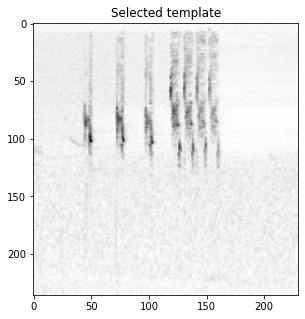

In [85]:
imCrop, sr=get_ROI(dcfiles[16])

You should see all instances of a template within your recording, well-centered.


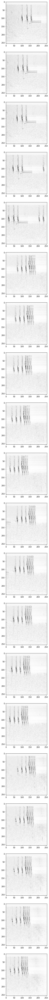

In [86]:
display_matches(imCrop)

In [144]:
j

169

In [143]:
for j in range(157,len(dcfiles)):
    sound = AudioSegment.from_mp3(dcfiles[j])
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=41000)
    #Pad field data with 1 second of reflected data (helps when searching for template)
    xc=np.concatenate((xc[sr:],xc))
    xc=np.append(xc,xc[:sr])

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                        n_fft=hop_length*4, hop_length=hop_length, power=1)

    pcen = librosa.pcen(mels * (2**31), time_constant=1.5,bias=10, gain=0.8, eps=1e-06,power=0.5,hop_length=hop_length)
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    im = cv2.imread("spec.png");

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)
    plt.pause(0.1)

    im = cv2.imread("spec.png");
    result = cv2.matchTemplate(imCrop,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    fig, axes = plt.subplots(5,5,figsize=(15,15))
    axes = axes.ravel()
    for i in range(np.min((len(df),25))):
        topick=newtemplate=im[10:237,df.y[i]:df.y[i]+256]
        axes[i].imshow(topick)
        axes[i].text(50, 50, str(i),
                 fontsize=18, ha='center')
    plt.pause(0.1)        
    bestidx = int(input('Enter the template number you wish to search for:'))
    newtemplate=im[10:246,df.y[bestidx]:df.y[bestidx]+220]   
    #newtemplate=im[10:256-10,df.y[0]:df.y[0]+220]
    
    df=list_candidates(newtemplate,im,0.5)
        
    add = input('Add these to the library?')
    
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    
    if (add=='y'): 
        fn='./dataset/audioclips/Dickcissel/dc_'+str(j)
        df.to_csv(fn)
        for i in range(len(df)):
            birdstr='dc_'+str(j)+'_'+str(i)
            # def spectrogram_image(start_sample,birddir,birdstr,y,sr):
            spectrogram_image(df.y[i]*512,'Dickcissel',birdstr,xc,sr)
            clear_output(wait=False)
    else:
        clear_output(wait=False)

Bell's Vireo

/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/mr.bwolfe/miniforge3/envs/birds/lib/python3.9/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


If all went well, the template of interest should be shown, well-centered.


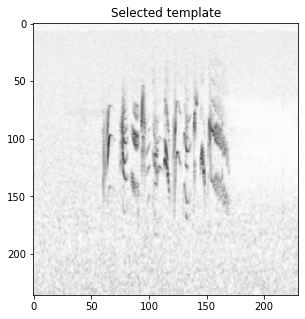

In [148]:
imCrop,sr=get_ROI(bvfiles[4])

You should see all instances of a template within your recording, well-centered.


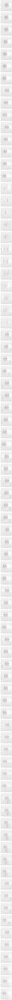

In [149]:
display_matches(imCrop)

In [230]:
j

235

In [229]:
for j in range(212,len(bvfiles)):
    sound = AudioSegment.from_mp3(bvfiles[j])
    sound.export('sandbox.wav', format="wav")
    #Upload the field data
    xc,sr= librosa.load('sandbox.wav',sr=41000)
    #Pad field data with 1 second of reflected data (helps when searching for template)
    xc=np.concatenate((xc[sr:],xc))
    xc=np.append(xc,xc[:sr])

    mels = librosa.feature.melspectrogram(y=xc, sr=sr, n_mels=n_mels,
                                        n_fft=hop_length*4, hop_length=hop_length, power=1)

    pcen = librosa.pcen(mels * (2**31), time_constant=1.5,bias=10, gain=0.8, eps=1e-06,power=0.5,hop_length=hop_length)
    img = scale_minmax(pcen, 0, 255).astype(np.uint8)
    img = np.flip(img, axis=0) # put low frequencies at the bottom in image
    img = 255-img # invert. make black==more energy

    out = 'spec.png'
    skimage.io.imsave(out, img)
    im = cv2.imread("spec.png");

    fig, ax = plt.subplots(figsize=(30,6))
    librosa.display.specshow(pcen,y_axis='mel',x_axis='time',sr=sr)
    plt.pause(0.1)

    im = cv2.imread("spec.png");
    result = cv2.matchTemplate(imCrop,im,5)

    image_max = ndi.maximum_filter(result, size=4, mode='reflect')
    # Comparison between image_max and im to find the coordinates of local maxima
    coordinates = peak_local_max(result, min_distance=4,threshold_abs = 0.05)

    x=coordinates[:,0]
    y=coordinates[:,1]
    call_times = librosa.frames_to_time(y, sr=sr)
    df=pd.DataFrame({'times':call_times,'x':x,'y':y,'corr':result[x,y]});
    df=df.sort_values('times').reset_index(drop=True)

    fig, axes = plt.subplots(5,5,figsize=(15,15))
    axes = axes.ravel()
    for i in range(np.min((len(df),25))):
        topick=newtemplate=im[10:237,df.y[i]:df.y[i]+256]
        axes[i].imshow(topick)
        axes[i].text(50, 50, str(i),
                 fontsize=18, ha='center')
    plt.pause(0.1)        
    bestidx = int(input('Enter the template number you wish to search for:'))
    newtemplate=im[10:246,df.y[bestidx]:df.y[bestidx]+220]   
    #newtemplate=im[10:256-10,df.y[0]:df.y[0]+220]
    
    df=list_candidates(newtemplate,im,0.4)
    
    add = input('Add these to the library?')
    
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    if (add.replace('.','').isdigit()):
        clear_output(wait=False)
        df=list_candidates(newtemplate,im,float(add))
        add = input('Add these to the library?')
    
    if (add=='y'): 
        fn='./dataset/audioclips/Bell\'sVireo/dc_'+str(j)
        df.to_csv(fn)
        for i in range(len(df)):
            birdstr='bv_'+str(j)+'_'+str(i)
            # def spectrogram_image(start_sample,birddir,birdstr,y,sr):
            spectrogram_image(df.y[i]*512,'Bell\'sVireo',birdstr,xc,sr)
            clear_output(wait=False)
    else:
        clear_output(wait=False)

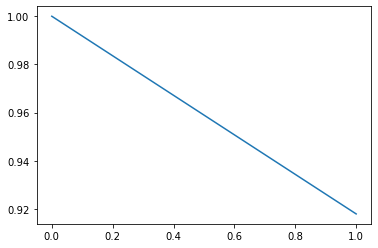

In [202]:
plt.plot(df['corr'])

Output train.csv

In [35]:
from os import listdir
from os.path import isfile, join
allnames=[]

empath='./dataset/jpgs/EasternMeadowlark'
emfiles = [f for f in listdir(empath) if isfile(join(empath, f))]
nbpath='./dataset/jpgs/NorthernBobwhite'
nbfiles = [f for f in listdir(nbpath) if isfile(join(nbpath, f))]
pbpath='./dataset/jpgs/PaintedBunting'
pbfiles = [f for f in listdir(pbpath) if isfile(join(pbpath, f))]
dcpath='./dataset/jpgs/Dickcissel'
dcfiles = [f for f in listdir(dcpath) if isfile(join(dcpath, f))]
bvpath='./dataset/jpgs/Bell\'sVireo'
bvfiles = [f for f in listdir(bvpath) if isfile(join(bvpath, f))]

allnames=np.append(allnames,emfiles)
allnames=np.append(allnames,nbfiles)
allnames=np.append(allnames,pbfiles)
allnames=np.append(allnames,dcfiles)
allnames=np.append(allnames,bvfiles)

types=[]
types=np.append(types,np.repeat('EasternMeadowlark',len(emfiles)))
types=np.append(types,np.repeat('NorthernBobwhite',len(nbfiles)))
types=np.append(types,np.repeat('PaintedBunting',len(pbfiles)))
types=np.append(types,np.repeat('Dickcissel',len(dcfiles)))
types=np.append(types,np.repeat('BellsVireo',len(bvfiles)))
train=pd.DataFrame({'fname':allnames,'types':types})
train

,fname,types
0,em_183_19.png,EasternMeadowlark
1,em_239_2.png,EasternMeadowlark
2,em_227_2.png,EasternMeadowlark
3,em_29_10.png,EasternMeadowlark
4,em_239_0.png,EasternMeadowlark
...,...,...
6967,bv_227_11.png,BellsVireo
6968,bv_31_24.png,BellsVireo
6969,bv_191_4.png,BellsVireo
6970,bv_4_17.png,BellsVireo


In [36]:
train.to_csv("xenocanto_train_t10.csv", index=False)